In [1]:
import pandas as pd
import numpy as np
import gc
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

/home/berkkarahan/anaconda3/envs/ml/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/berkkarahan/anaconda3/envs/ml/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
def readexcel_set_df_names(fname, sheet):
    df = pd.read_excel(fname, sheet_name=sheet)
    df.columns = df.iloc[0,:].values
    df.drop(df.index[0], inplace=True)
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])
    df.set_index('Timestamp', inplace=True)
    df = df.astype(np.float)
    return df

In [3]:
tr = readexcel_set_df_names('data_analytics.xlsx','Train')
ts = readexcel_set_df_names('data_analytics.xlsx','Test')

In [4]:
#resample and check for missing values
tr = tr.resample(rule='8H', base=00).mean()
tr.isna().sum()

Target    150
V1        150
V2        150
V3        150
V4        150
V5        150
V6        150
V7        150
V8        150
V9        150
V10       150
V11       150
V12       150
V13       150
V14       150
V15       150
V16       150
V17       150
V18       150
V19       150
V20       150
V21       150
V22       150
V23       150
V24       150
V25       150
V26       150
V27       150
V28       150
V29       150
V30       150
V31       150
V32       150
V33       150
V34       150
V35       150
V36       150
V37       150
V38       150
V39       150
V40       150
V41       150
V42       150
V43       150
V44       150
V45       150
V46       150
V47       150
V48       150
V49       150
V50       150
V51       150
dtype: int64

In [5]:
#interpolate missing values.
tr.interpolate(method='time', inplace=True)

In [6]:
from helpers.funcs import resample

/home/berkkarahan/anaconda3/envs/ml/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/berkkarahan/anaconda3/envs/ml/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [7]:
tr_res = pd.DataFrame()

In [8]:
for v in tr.columns.values:
    tr_res[v] = resample(tr[v])

/home/berkkarahan/Desktop/tupras_isoforest/helpers/funcs.py:38: FutureWarning: pandas.tslib is deprecated and will be removed in a future version.
You can access Timestamp as pandas.Timestamp
  tseries.index[0], pd.tslib.Timestamp), 'Object must have a datetime-like index.'
/home/berkkarahan/Desktop/tupras_isoforest/helpers/funcs.py:72: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).mean()
  tseries = tseries.resample(short_rate, how='mean').interpolate()
/home/berkkarahan/Desktop/tupras_isoforest/helpers/funcs.py:75: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).ffill()
  tseries = tseries.resample(rate, how='ffill')


In [9]:
del tr;gc.collect()

489

In [10]:
def make_train_test_plt(tr, ts, varname, save=False):
    fig, ax = plt.subplots(figsize=(30,6))
    tr[varname].plot(label='train')
    ts[varname].plot(label='test')
    plt.legend(loc='upper left')
    plt.title(varname)

/home/berkkarahan/anaconda3/envs/ml/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


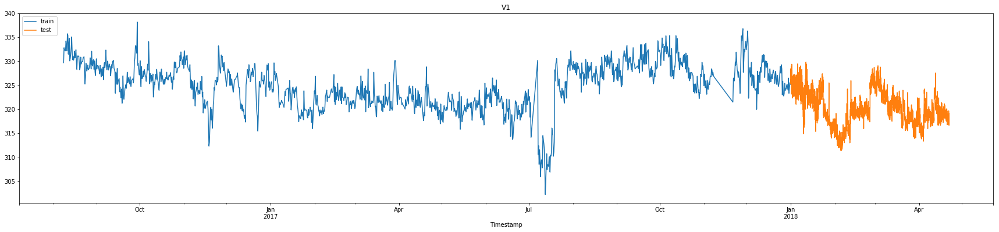

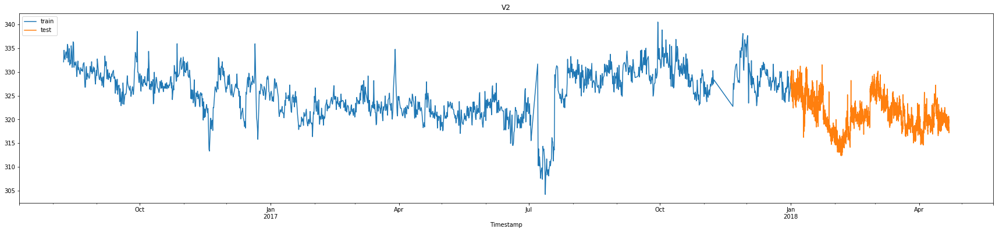

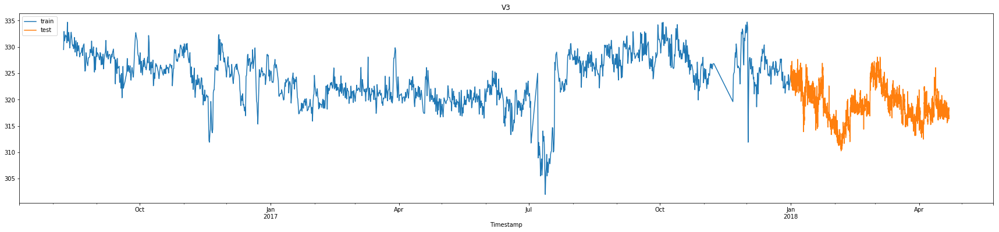

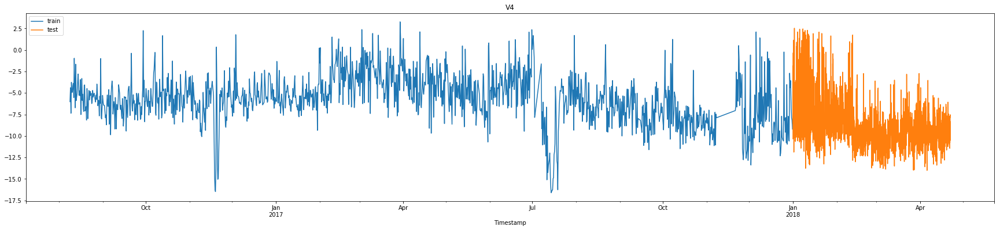

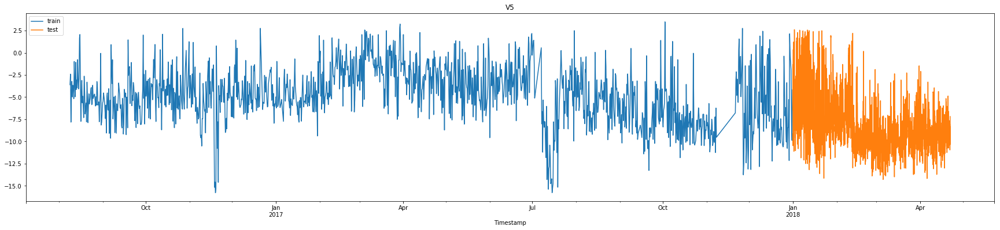

...

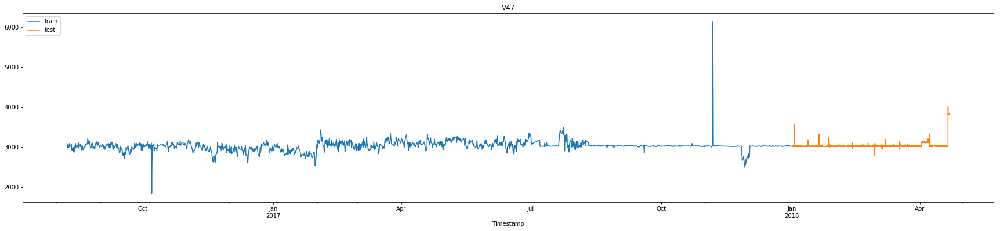

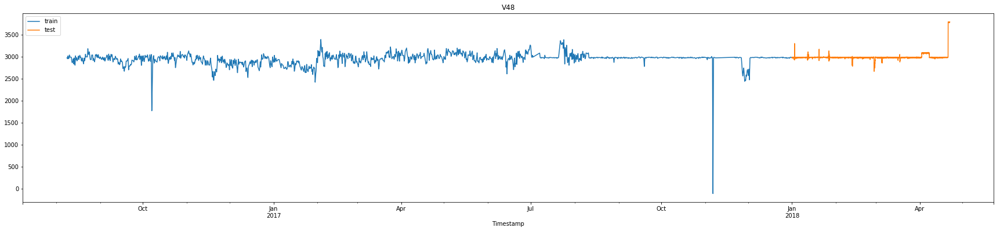

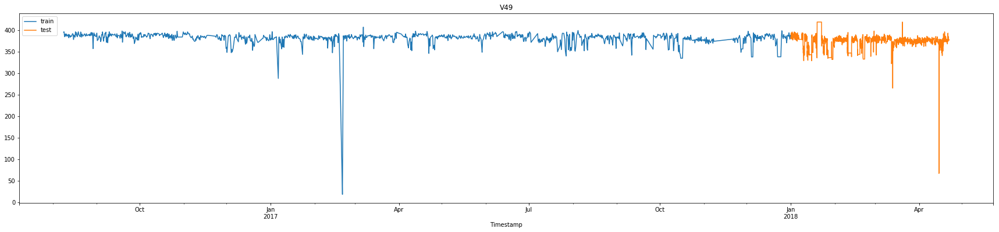

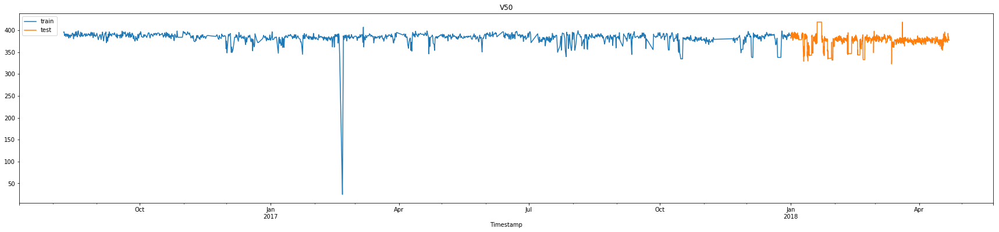

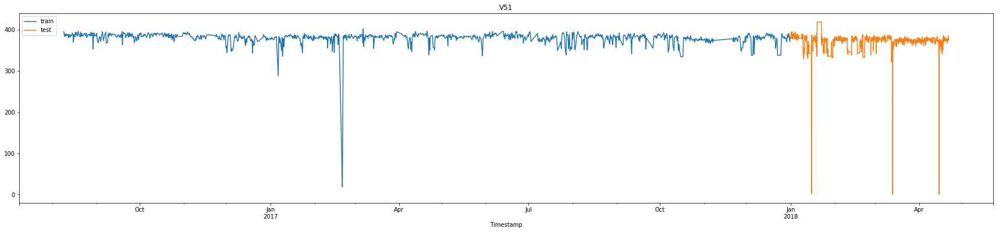

In [11]:
varnames = ["V"+str(x) for x in range(1,52)]
for v in varnames:
    make_train_test_plt(tr_res, ts, v)

In [12]:
from helpers.anomalies import SimpleAnomalies

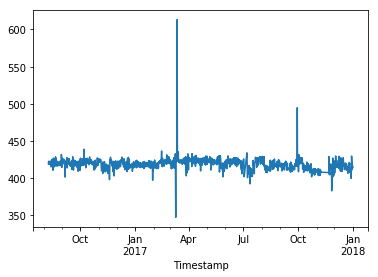

In [13]:
res_t = tr_res.Target.copy()
sa = SimpleAnomalies(res_t, 6, 2)
sa.explain_anomalies()
sa.buildIndexes()
imputed = sa.imputeAnomaliesRolling()
imputed.plot()

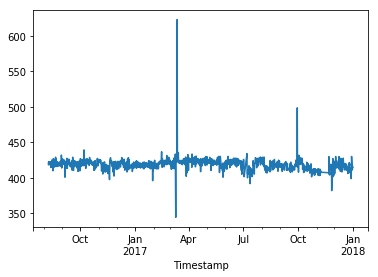

In [14]:
tr_res.Target.plot()

In [15]:
del res_t, imputed; gc.collect()

205691

In [16]:
tsc1 = ts.copy()
rseed = 123123
for nm in ts.columns.values:
    df = ts[nm].copy()
    sa_ = SimpleAnomalies(df, 6, 2)
    sa_.explain_anomalies()
    sa_.buildIndexes()
    imputed = sa_.imputeAnomaliesRolling()
    tsc1[nm] = imputed
    del sa_, df;gc.collect()

In [18]:
trr1 = tr_res.copy()
rseed = 123123
for nm in ts.columns.values:
    df = ts[nm].copy()
    sa_ = SimpleAnomalies(df, 6, 2)
    sa_.explain_anomalies()
    sa_.buildIndexes()
    imputed = sa_.imputeAnomaliesRolling()
    tsc1[nm] = imputed
    del sa_, df;gc.collect()

In [19]:
trr1.to_csv('valids/v_tr.csv')
tsc1.to_csv('valids/v_ts.csv')

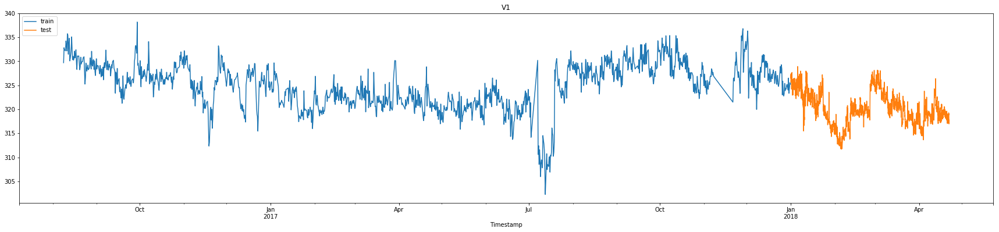

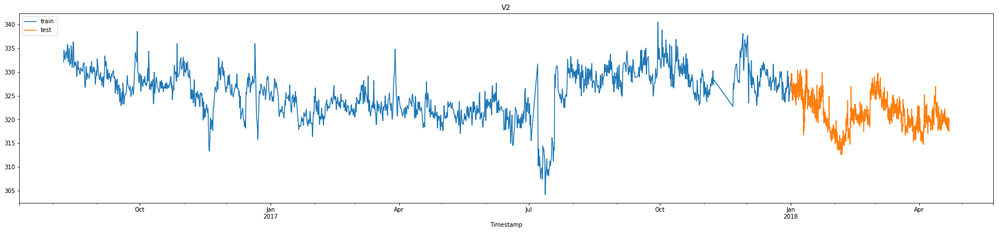

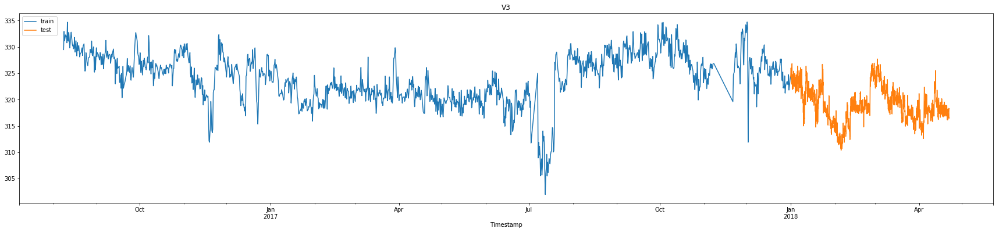

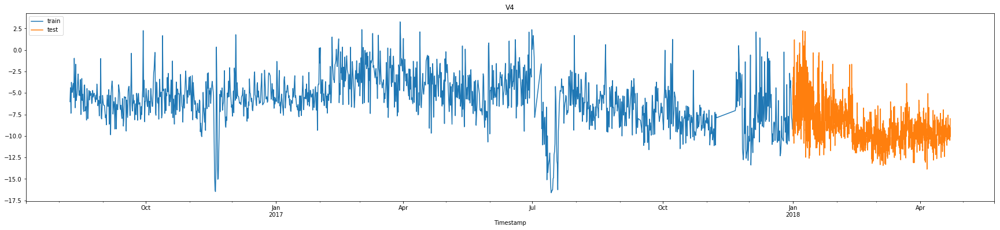

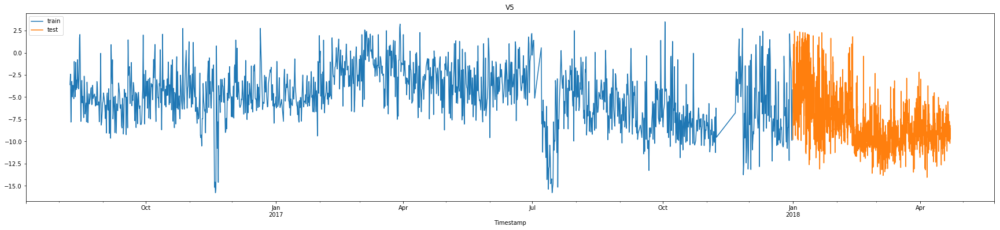

...

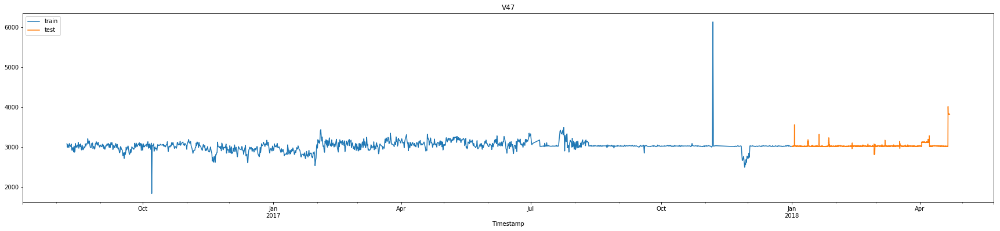

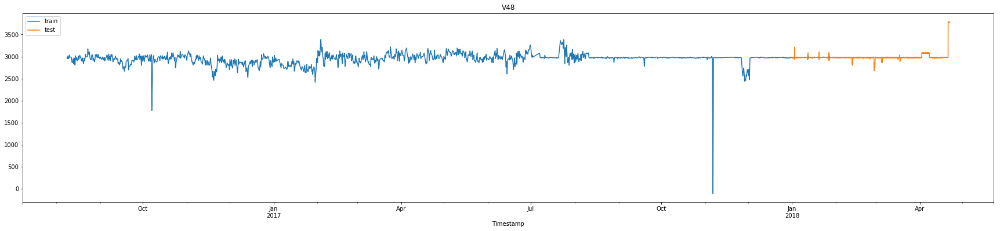

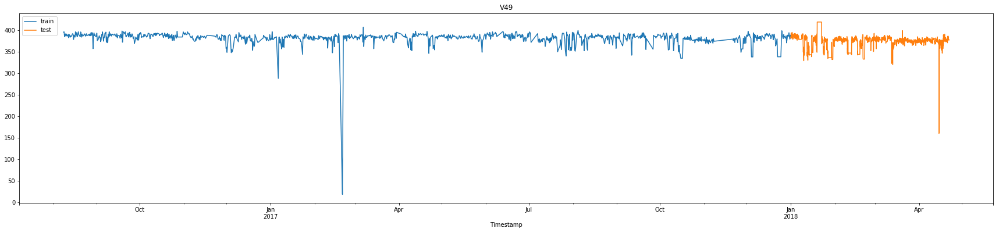

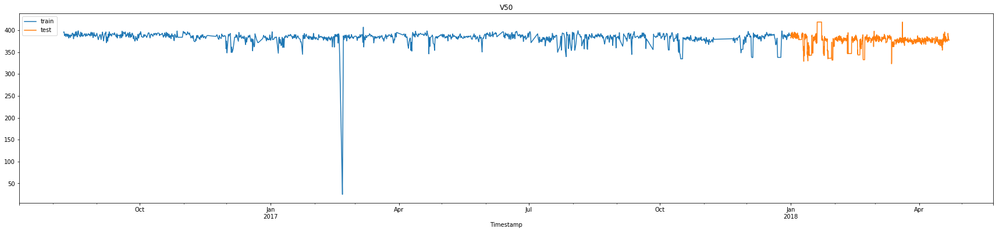

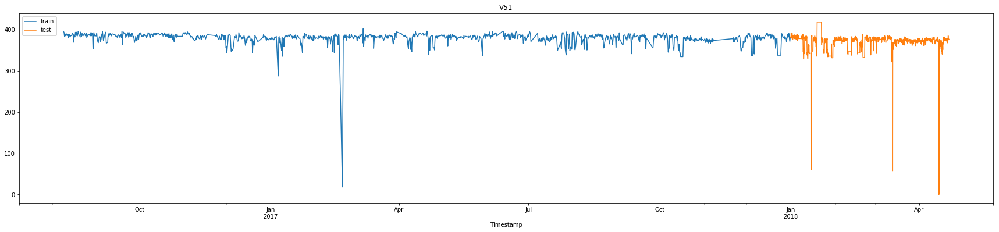

In [20]:
varnames = ["V"+str(x) for x in range(1,52)]
for v in varnames:
    make_train_test_plt(trr1, tsc1, v)